# Topic identification with Top2Vec

### 1. Import Libraries

In [6]:
# Basic data processing
import numpy as np 
import pandas as pd 
import json
import os
import pickle

# Logging 
from loguru import logger

# Text preprocessing
import re
import string
import nltk
for dependency in ['punkt', 'wordnet', 'omw-1.4', 'stopwords', 'averaged_perceptron_tagger']:
    nltk.download(dependency, quiet=True)

# Visualising UMAP 2D projection of documents
import matplotlib.pyplot as plt

# Top2Vec model
from top2vec.Top2Vec import Top2Vec

### 2. Function for preprocessing text

In [4]:
def preprocess(text):
    # Lowercasing words
    text = text.lower()
    
    # Removing HTML tag
    text = re.sub(r'&amp', '', text)

    # Replace "&" with "and"
    text = re.sub(r'&','and', text)
    
    # Removing mentions 
    text = re.sub(r'@\w+ ', '', text)
    
    # Removing punctuation
    text = text.translate(str.maketrans('', '', string.punctuation.replace('-',''))) # Taking hyphens out of punctuation to remove
    text = re.sub(r' - ','', text) # Removing dash lines bounded by whitespace (and therefore not part of a word)
    text = re.sub(r'[‘’“”—]','',text) # Removing punctuation that is not captured by string.punctuation
    
    # Removing 'RT' and 'via'
    text = re.sub(r'(^rt|^via)((?:\\b\\W*@\\w+)+): ', '', text)
    
    # Removing odd special characters
    text = re.sub(r"[┻┃━┳┓┏┛┗]","", text)
    text = re.sub(r"\u202F|\u2069|\u200d|\u2066|\U0001fa86","", text)
    
    # Removing URLs
    text = re.sub(r'http\S+', '', text)
    
    # Removing numbers
    text = re.sub(r'[0-9.]','', text)

    # Removing idiosynchratic characters in our data
    text = re.sub(r'-\n|\n-|\na-|\nb-|–|«|--', '', text)
    text = re.sub(r'- ', ' ', text)

    # Removing separators and superfluous whitespace
    text = text.strip()
    text = re.sub(r' +',' ',text)

    # Tokenizing
    tokenizer = nltk.TweetTokenizer() 
    tokens = tokenizer.tokenize(text)

    # Removing stopwords
    stop_words_list = nltk.corpus.stopwords.words("english")
    tokens = [i for i in tokens if i not in stop_words_list]
    
    # Removing generic Europe- and nuclear-related words
    stop_words_list = []
    stop_words_list.extend(['nuclear', 'renewables']) # 'atomic', 'radioactive'
    tokens = [i for i in tokens if i not in stop_words_list]

    return tokens

### 3. Load data

In [6]:
with open("../../Data/df_tweets_selected_users_after_oct.p", 'rb') as f:
    tweets_df = pickle.load(f) 
tweets_text = tweets_df['text'].to_list()
logger.info(f'Loaded {len(tweets_df)} tweets')

## Train Top2Vec Model
In the following code chunk, we fit the Top2Vec model. With the current parameter settings, it takes only a couple of minutes to fit on a standard laptop. <br>

Parameters:
  * ``documents``: Input corpus, should be a list of strings.

  * ``tokenizer``: Function for preprocessing and tokenizing text.

  * ``min_count``: All tokens with less than `min_count` number of occurrences in the corpus will be filtered.

  * ``hdbscan_min_cluster_size``: Smallest document grouping size that should be considered a cluster.

  * ``embedding_model``: Which embedding model to use. `doc2vec` will compute document embeddings directly from the data while there are a number of pretrained models that can be used, e.g. `universal-sentence-encoder`.
  
  * ``speed``: This parameter will determine how fast the model takes to train. 
    The 'fast-learn' option is the fastest and will generate the lowest quality
    vectors. The 'learn' option will learn better quality vectors but take a longer
    time to train. The 'deep-learn' option will learn the best quality vectors but 
    will take significant time to train.  
    
  * ``workers``: The amount of worker threads to be used in training the model. Larger
    amount will lead to faster training.

  * ``doc2vec_vector_size``: Dimensionality of document vectors.

  * ``doc2vec_window``: The maximum distance between the current and predicted word within a sentence.
  
  * ``doc2vec_samples_threshold``: The threshold for configuring which higher-frequency words are randomly downsampled, useful range is (0, 1e-5).
    
See [Top2Vec documentation](https://top2vec.readthedocs.io/en/latest/README.html) as well as the [documentation for gensim's Doc2Vec implementation](https://radimrehurek.com/gensim/models/doc2vec.html).

In [2]:
# Fit Top2Vec model
top2vec = Top2Vec(
    documents=tweets_text,
    tokenizer=preprocess,

    embedding_model='universal-sentence-encoder',
    min_count=2,
    hdbscan_min_cluster_size=15,
    
    # Below parameters are only relevant if doc2vec is fittied 
    speed="deep-learn",
    workers=4,
    doc2vec_vector_size=300,
    doc2vec_window=8,
    doc2vec_samples_threshold=1e-5 
    )
logger.info(f'Found {top2vec.get_num_topics()} topics')

# Save Top2Vec model
logger.info(f'Saving Top2Vec model')
top2vec.save(f'Models & outputs/top2vec_model12345.txt')

## Analysis

### 1. Load model
If the model was not fitted in the above code, it can be loaded from a pickle file.

In [1]:
top2vec = Top2Vec.load('Models & outputs/top2vec_model.txt')

### 2. Create wordsclouds with tokens for top 20 topics

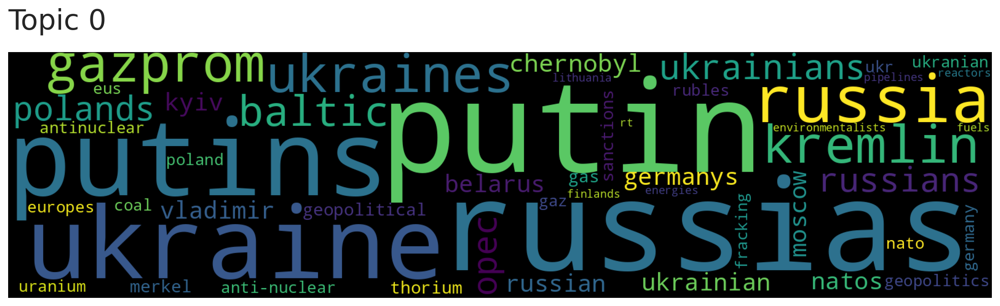

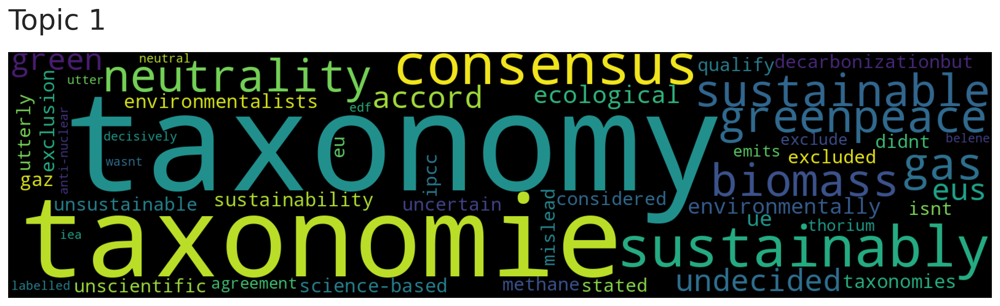

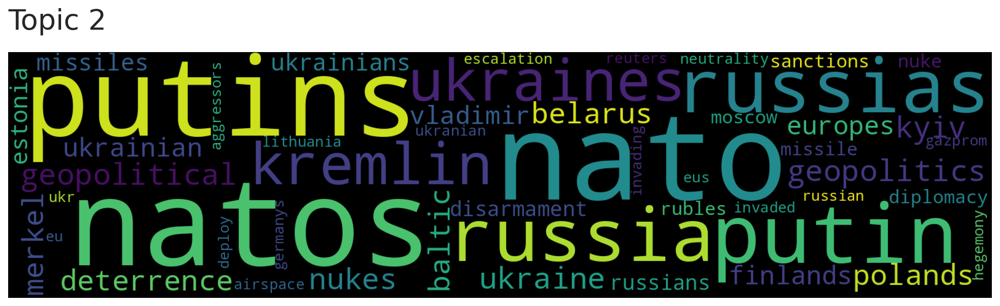

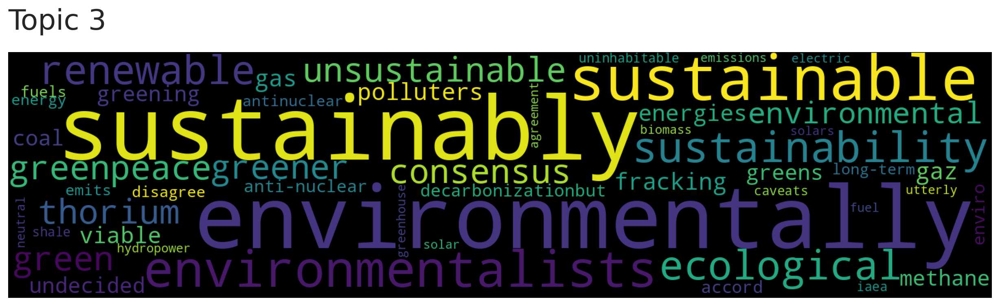

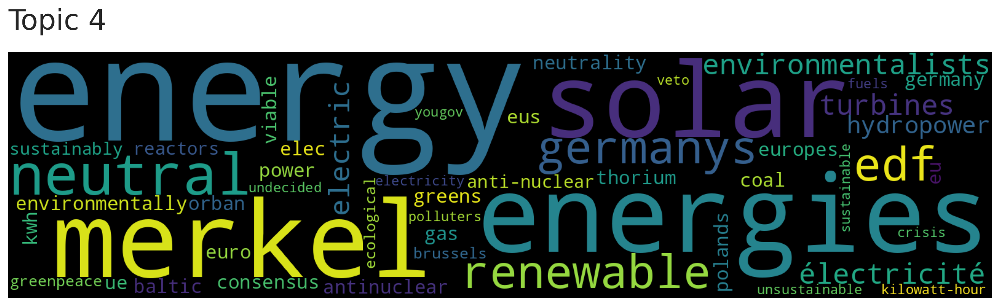

...

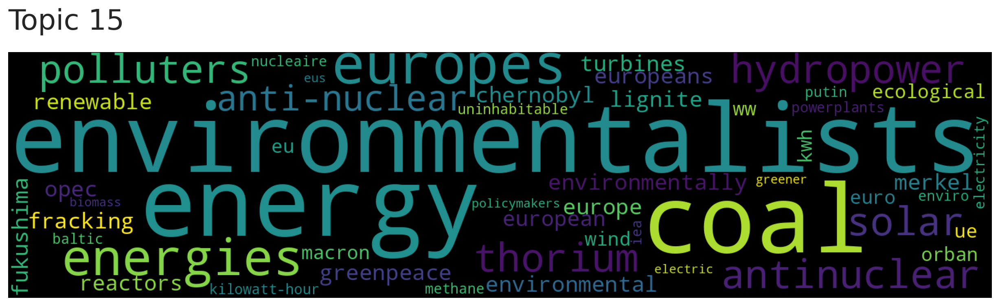

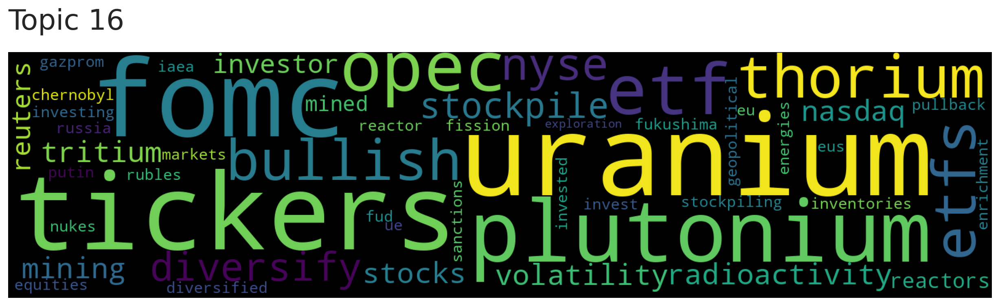

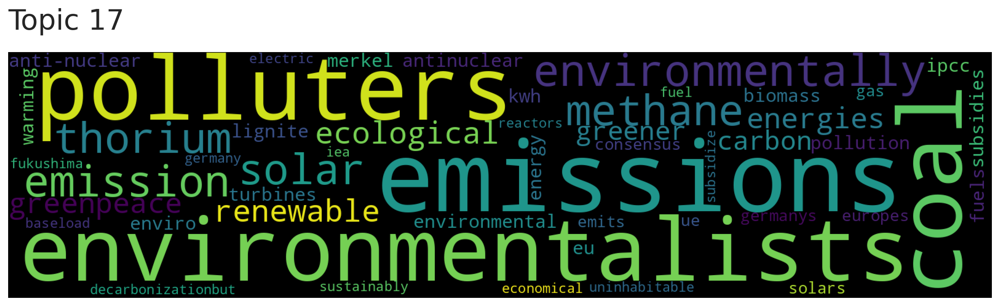

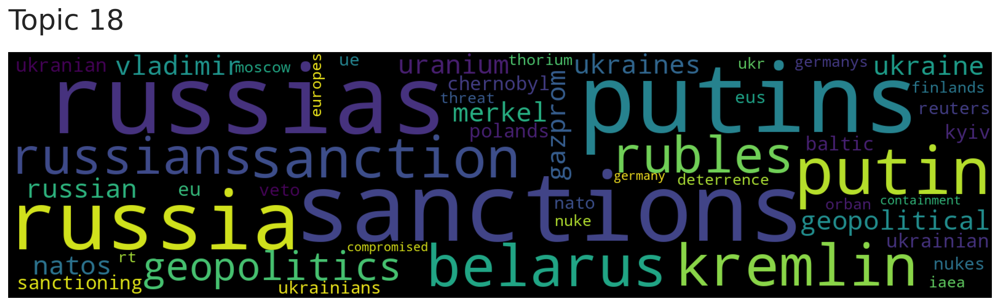

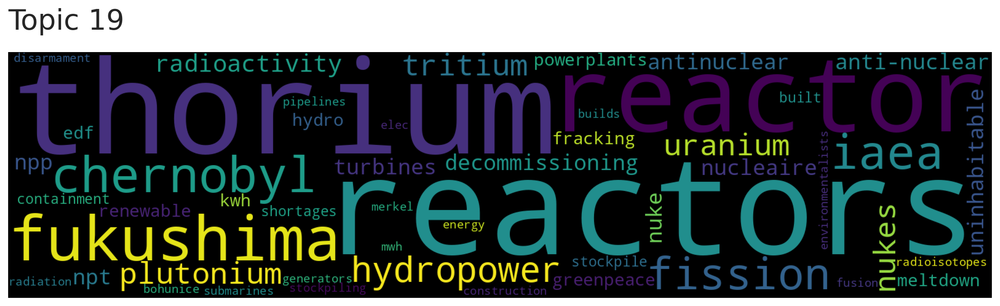

In [ ]:
for topic in topic_nums[:20]:
    top2vec.generate_topic_wordcloud(topic)

### 3. Inspect each topic manually using top words and documents

In [ ]:
def inspect_topic(manual_num, n_docs=None, query_substr=None):
    '''
    Print top words and top docs for a given
    topic.
    -------
    manual_num (int): manually assigned topic number (i.e. 1-indexed).
    
    n_docs (int, optional): n top documents to print for a given topic.
        Default is to print all docs within a given topic.
    
    query_substr (str, optional): if specified, only documents containing
        this substring will be printed. Cannot be specified with n_docs,
        as this would return only results within a subset of topic docs.
    '''

    # Returned topics are 0-indexed, which we won't change
    default_topic_idx = manual_num-1

    # Get topic sizes so we know max n docs
    topic_sizes, topic_nums = top2vec.get_topic_sizes()
    docs_to_return = topic_sizes[default_topic_idx]

    # Override n docs to return, if specified
    if n_docs:
        docs_to_return = n_docs

    # Get docs for input topic id
    documents, document_scores, document_ids = top2vec.search_documents_by_topic(
        topic_num=default_topic_idx,
        num_docs=docs_to_return
        )

    # Limit output to docs contaigning certain substring, if specified
    if query_substr and n_docs:
        raise Exception('Please do NOT specify n_docs with substring query!\nOtherwise the search is only carried out for a subset of topic docs.')
    
    # Throw exception if substring query attempted on subset of docs!
    elif query_substr:
        documents = [doc for doc in documents if query_substr in doc]

    # Print output
    print('--- TOP 50 WORDS ---\n', topic_words[default_topic_idx], '\n')

    print(f'--- TOP {docs_to_return} DOCS. SUBSTRING QUERY: {query_substr} (n = {len(documents)}) ---\n', documents)

In [ ]:
inspect_topic(
    20
    ,n_docs=100
    #,query_substr='France'
    )

--- TOP 50 WORDS ---
 ['reactors' 'thorium' 'reactor' 'fukushima' 'chernobyl' 'iaea' 'fission'
 'hydropower' 'plutonium' 'uranium' 'nukes' 'tritium' 'radioactivity'
 'decommissioning' 'turbines' 'npt' 'antinuclear' 'anti-nuclear'
 'uninhabitable' 'nuke' 'npp' 'nucleaire' 'powerplants' 'hydro' 'edf'
 'greenpeace' 'renewable' 'meltdown' 'kwh' 'fracking' 'containment'
 'stockpile' 'shortages' 'built' 'radioisotopes' 'submarines' 'mwh'
 'energy' 'construction' 'fusion' 'merkel' 'generators' 'stockpiling'
 'elec' 'bohunice' 'builds' 'disarmament' 'pipelines' 'environmentalists'
 'radiation'] 

--- TOP 109 DOCS. SUBSTRING QUERY: None (n = 109) ---
 ['#Zaporizhzhya thread:\n\nit is the biggest nuclear power plant in europe (6 reactors)\n\n3 reactors were offline already \n\n2 more were recently shut down\n\nthere seems to be 1 reactor still operating https://t.co/m3GJ3YiCvw'
 '#Zaporizhzhya thread:\n\nit is the biggest nuclear power plant in europe (6 reactors)\n\n3 reactors were offline alre

### 4. Visualizing document clusters

In [ ]:
# Visualisation UMAP 2D projection (vs. 5D used in actual model)
vectors = top2vec._get_document_vectors()
reduced2d = umap.UMAP(n_neighbors=15, n_components=2, metric='cosine', verbose=True).fit_transform(vectors)
x, y = reduced2d[:,0], reduced2d[:,1]

UMAP(angular_rp_forest=True, metric='cosine', verbose=True)
Sat Jun 11 13:51:43 2022 Construct fuzzy simplicial set
Sat Jun 11 13:51:43 2022 Finding Nearest Neighbors
Sat Jun 11 13:51:43 2022 Building RP forest with 9 trees
Sat Jun 11 13:51:44 2022 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	 5  /  13
	 6  /  13
	 7  /  13
	Stopping threshold met -- exiting after 7 iterations
Sat Jun 11 13:51:46 2022 Finished Nearest Neighbor Search
Sat Jun 11 13:51:47 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sat Jun 11 13:52:42 2022 Finished embedding


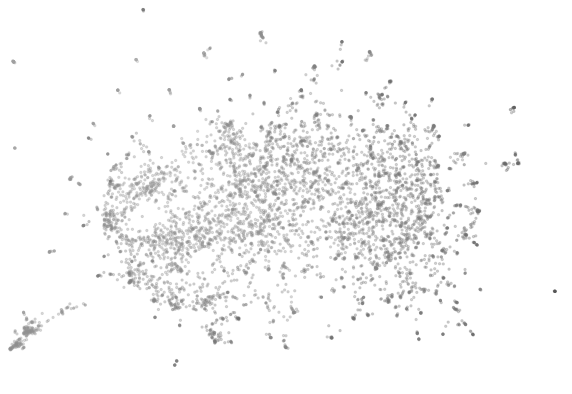

In [ ]:
plt.figure(figsize=(10,7))
plt.scatter(x,y, s=5, c=z, marker='o', alpha=.3)
plt.xlim(2,17)
plt.ylim(0,10)
plt.axis('off')
plt.show()